# Nome: Henrico Nardelli Bela
## RM: 95985
## Turma: 2TIAR

---

# Clusterizacao - Case ImdbMovies

# IMDb TOP 250 Movies
![An image](https://static.amazon.jobs/teams/53/images/IMDb_Header_Page.jpg?1501027252)

**Este projeto consiste em treinar um sistema de recomendação de filmes utilizando as informações referentes aos top 250 filmes melhor avaliados pelo público na plataforma IMDb.**
*   A extração dos dados será feita por técnicas de web scraping (crawler).
*   O objetivo principal será agrupar os 250 filmes em "n" clusters classificados a partir das suas sinopses, aplicando técnicas de processamento de texto e algoritmos de clusterização.
*   Ao final, teremos um sistemas de recomendação baseado na similaridade das sinopses, e não apenas dos generos.

**Exemplo de aplicação prática: usuários receberão recomendações de filmes que estejam no mesmo cluster de sinopses de outros filmes que ele já tenha curtido.**

# Import das bibliotecas

In [83]:
import pandas as pd
import numpy as np
import requests
from pprint import pprint
from bs4 import BeautifulSoup
import re
import json
from urllib.request import Request, urlopen
from lxml import html
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from PIL import Image
from io import BytesIO
import cv2
from unicodedata import normalize
import string
from nltk.stem import PorterStemmer

# Web Scraping / Crawler

In [84]:
userAgents=[
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

url = 'https://www.imdb.com/chart/top/?ref_=nv_mv_250'
response = requests.get(url, headers={"User-agent": userAgents[1]})
response

<Response [200]>

In [85]:
# userAgents=[
#     "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
#     "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

# url = 'https://www.imdb.com/chart/moviemeter/?ref_=chtbo_ql_2'
# response = requests.get(url, headers={"User-agent": userAgents[1]})
# response

In [86]:
# userAgents=[
#     "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
#     "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

# url = 'https://www.imdb.com/chart/boxoffice/'
# response = requests.get(url, headers={"User-agent": userAgents[1]})
# response

In [87]:
html = response.text
html

'<!DOCTYPE html><html lang="en-US" xmlns:og="http://opengraphprotocol.org/schema/" xmlns:fb="http://www.facebook.com/2008/fbml"><head><meta charSet="utf-8"/><meta name="viewport" content="width=device-width"/><script>if(typeof uet === \'function\'){ uet(\'bb\', \'LoadTitle\', {wb: 1}); }</script><script>window.addEventListener(\'load\', (event) => {\n        if (typeof window.csa !== \'undefined\' && typeof window.csa === \'function\') {\n            var csaLatencyPlugin = window.csa(\'Content\', {\n                element: {\n                    slotId: \'LoadTitle\',\n                    type: \'service-call\'\n                }\n            });\n            csaLatencyPlugin(\'mark\', \'clickToBodyBegin\', 1693355315065);\n        }\n    })</script><title>IMDb Top 250 Movies</title><meta name="description" content="IMDb Top 250 as rated by regular IMDb voters" data-id="main"/><meta property="og:site_name" content="IMDb"/><meta property="og:title" content="IMDb Top 250 Movies"/><meta 

In [88]:
#BeautifulSoup
bs = BeautifulSoup(html)
pprint(bs)


<!DOCTYPE html>
<html lang="en-US" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/"><head><meta charset="utf-8"/><meta content="width=device-width" name="viewport"/><script>if(typeof uet === 'function'){ uet('bb', 'LoadTitle', {wb: 1}); }</script><script>window.addEventListener('load', (event) => {
        if (typeof window.csa !== 'undefined' && typeof window.csa === 'function') {
            var csaLatencyPlugin = window.csa('Content', {
                element: {
                    slotId: 'LoadTitle',
                    type: 'service-call'
                }
            });
            csaLatencyPlugin('mark', 'clickToBodyBegin', 1693355315065);
        }
    })</script><title>IMDb Top 250 Movies</title><meta content="IMDb Top 250 as rated by regular IMDb voters" data-id="main" name="description"/><meta content="IMDb" property="og:site_name"/><meta content="IMDb Top 250 Movies" property="og:title"/><meta content="IMDb Top 250 as rated b

## Title EN

In [89]:
titles = bs.find_all('h3', attrs={'class': 'ipc-title__text'})
titles

[<h3 class="ipc-title__text">IMDb Charts</h3>,
 <h3 class="ipc-title__text">1. Um Sonho de Liberdade</h3>,
 <h3 class="ipc-title__text">2. O Poderoso Chefão</h3>,
 <h3 class="ipc-title__text">3. Batman: O Cavaleiro das Trevas</h3>,
 <h3 class="ipc-title__text">4. O Poderoso Chefão II</h3>,
 <h3 class="ipc-title__text">5. 12 Homens e uma Sentença</h3>,
 <h3 class="ipc-title__text">6. A Lista de Schindler</h3>,
 <h3 class="ipc-title__text">7. O Senhor dos Anéis: O Retorno do Rei</h3>,
 <h3 class="ipc-title__text">8. Pulp Fiction - Tempo de Violência</h3>,
 <h3 class="ipc-title__text">9. O Senhor dos Anéis: A Sociedade do Anel</h3>,
 <h3 class="ipc-title__text">10. Três Homens em Conflito</h3>,
 <h3 class="ipc-title__text">11. Forrest Gump: O Contador de Histórias</h3>,
 <h3 class="ipc-title__text">12. Clube da Luta</h3>,
 <h3 class="ipc-title__text">13. O Senhor dos Anéis: As Duas Torres</h3>,
 <h3 class="ipc-title__text">14. A Origem</h3>,
 <h3 class="ipc-title__text">15. Star Wars: Epi

In [90]:
list_title_en = []
for x in titles[1:-12]:
  tit = (x.text).split(">")[0].strip()
  list_title_en.append(tit)

display(len(list_title_en))
list_title_en[:5]

250

['1. Um Sonho de Liberdade',
 '2. O Poderoso Chefão',
 '3. Batman: O Cavaleiro das Trevas',
 '4. O Poderoso Chefão II',
 '5. 12 Homens e uma Sentença']

## Year

In [91]:
list_years = []
years = bs.find_all('div', attrs={'class':'cli-title-metadata'})
for y in years:
  year = y.find('span', attrs={'class':'cli-title-metadata-item'}).text
  list_years.append(year)
display(len(list_years))
list_years[:5]

250

['1994', '1972', '2008', '1974', '1957']

## Rating

In [92]:
ratings = bs.find_all('div', attrs={'class':'cli-ratings-container'})
list_rating = []
for r in ratings:
  rating = r.find('span').text
  list_rating.append(rating)

display(len(list_rating))
pprint(list_rating[:5])

250

['9.3\xa0(2.8M)',
 '9.2\xa0(1.9M)',
 '9.0\xa0(2.8M)',
 '9.0\xa0(1.3M)',
 '9.0\xa0(829K)']


In [93]:
image_links = bs.find_all("div", attrs ={"class":"ipc-media__img"})
list_images = []
for i in image_links:
    images = i.find("img").get("src")
    list_images.append(images)

In [94]:
list_images[:5]

['https://m.media-amazon.com/images/M/MV5BNDE3ODcxYzMtY2YzZC00NmNlLWJiNDMtZDViZWM2MzIxZDYwXkEyXkFqcGdeQXVyNjAwNDUxODI@._V1_QL75_UX140_CR0,1,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BZjgwNzE5ODgtYzAyZC00YTZhLThhNDktMDVlOGNhYzk5NTVkXkEyXkFqcGdeQXVyMTAzMDM4MjM0._V1_QL75_UY207_CR3,0,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BM2E1ZjEyYWQtMjgyMy00ZTkwLThkM2QtN2YwM2NmYzAyYjE0XkEyXkFqcGdeQXVyMTAzMDM4MjM0._V1_QL75_UY207_CR8,0,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BOGM2M2Q0ZWQtZjc5NC00NDY4LWIxYTktMDE4ZjIyYTRlNTIyXkEyXkFqcGdeQXVyODc0OTEyNDU@._V1_QL75_UY207_CR4,0,140,207_.jpg',
 'https://m.media-amazon.com/images/M/MV5BODRmNWRiYmUtNGM2Yy00NTgwLTgxNzMtMGExYzI5NjllNjBhXkEyXkFqcGdeQXVyMTAzMDM4MjM0._V1_QL75_UY207_CR3,0,140,207_.jpg']

In [95]:
image_arrays = []
for img_url in list_images:
    if img_url:
        img_response = requests.get(img_url)
        if img_response.status_code == 200:
            img_bytes = BytesIO(img_response.content)
            img_pil = Image.open(img_bytes).convert("L")
            img_np = np.array(img_pil)
            image_arrays.append(img_np)

In [96]:
len(image_arrays)

250

In [97]:
image = Image.fromarray(image_arrays[2])
image.show()

## Genre, Title PT & Year

In [98]:
list_links = []
for a in bs.find_all('a', href=True):
  if '/title/' in a['href'] and 'https://www.imdb.com/'+ a['href'] not in list_links:
    list_links.append(('https://www.imdb.com/'+a['href'])[:-15])

#Remove duplicates
list_links = list(dict.fromkeys(list_links))
#Deleting first element
list_links = list_links[1:]

display(len(list_links))
list_links[:5]

250

['https://www.imdb.com//title/tt0111161/',
 'https://www.imdb.com//title/tt0068646/',
 'https://www.imdb.com//title/tt0468569/',
 'https://www.imdb.com//title/tt0071562/',
 'https://www.imdb.com//title/tt0050083/']

In [99]:
headers = {
          'authority': 'www.amazon.com.br',
          'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
          'accept-language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
          'cache-control': 'max-age=0',
          'device-memory': '8',
          'downlink': '10',
          'dpr': '1.875',
          'ect': '4g',
          'rtt': '50',
          'sec-ch-device-memory': '8',
          'sec-ch-dpr': '1.875',
          'sec-ch-ua': '"Chromium";v="110", "Not A(Brand";v="24", "Google Chrome";v="110"',
          'sec-ch-ua-mobile': '?0',
          'sec-ch-ua-platform': '"Windows"',
          'sec-ch-ua-platform-version': '"10.0.0"',
          'sec-ch-viewport-width': '455',
          'sec-fetch-dest': 'document',
          'sec-fetch-mode': 'navigate',
          'sec-fetch-site': 'none',
          'sec-fetch-user': '?1',
          'upgrade-insecure-requests': '1',
          'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36',
          'viewport-width': '455',
          }
############################################################
list_genre = []
list_title_pt = []
list_year = []
list_sinopse = []

for link in list_links:
  time.sleep(.5)
  response = requests.get(link, headers = headers)
  html = response.content
  soup = BeautifulSoup(html, "html.parser")

  #genre
  try:
    for genre in soup.find('span', {'class':'ipc-chip__text'}):
      genre = genre.text
      list_genre.append(genre)
  except:
      list_genre.append(np.nan)
      print('Nan')

  #title_PT and year
  try:
    for x in soup.find('title'):
      #title_pt
      title_pt = (x.text)[:-14].strip()
      list_title_pt.append(title_pt)
      #year
      year = (x.text)[-12:-8].strip()
      list_year.append(year)

  except:
    list_title_pt.append(np.nan)
    list_year.append(np.nan)

  #sinopse
  try:
    for sin in soup.find('span', {"data-testid":"plot-xl"}):
      sinopse = sin.text
      list_sinopse.append(sinopse)
  except:
    list_sinopse.append(np.nan)

  print(genre, title_pt, year, sinopse[:20])

display(len(list_genre), len(list_title_pt), len(list_year), len(list_sinopse))
print(list_genre[:5])
print(list_title_pt[:5])
print(list_year[:5])
display(list_sinopse[:2])

Drama Um Sonho de Liberdade 1994 Dois homens presos s
Policial O Poderoso Chefão 1972 O patriarca idoso de
Ação Batman: O Cavaleiro das Trevas 2008 Quando a ameaça conh
Policial O Poderoso Chefão II 1974 Em 1950, Michael Cor
Policial 12 Homens e uma Sentença 1957 O julgamento de um a
Biografia A Lista de Schindler 1993 Na Polônia ocupada p
Ação O Senhor dos Anéis: O Retorno do Rei 2003 Gandalf e Aragorn li
Policial Pulp Fiction - Tempo de Violência 1994 As vidas de dois ass
Ação O Senhor dos Anéis: A Sociedade do Anel 2001 Um manso hobbit do C
Aventura Três Homens em Conflito 1966 Um impostor se junta
Drama Forrest Gump: O Contador de Histórias 1994 Os governos dos pres
Drama Clube da Luta 1999 Um trabalhador de es
Ação O Senhor dos Anéis: As Duas Torres 2002 Enquanto Frodo e Sam
Ação A Origem 2010 Um ladrão que rouba 
Ação Star Wars: Episódio V - O Império Contra-Ataca 1980 Os rebeldes derrotar
Ação Matrix 1999 Um hacker aprende co
Biografia Os Bons Companheiros 1990 A historia do Hen

250

250

250

250

['Drama', 'Policial', 'Ação', 'Policial', 'Policial']
['Um Sonho de Liberdade', 'O Poderoso Chefão', 'Batman: O Cavaleiro das Trevas', 'O Poderoso Chefão II', '12 Homens e uma Sentença']
['1994', '1972', '2008', '1974', '1957']


['Dois homens presos se reúnem ao longo de vários anos, encontrando consolo e eventual redenção através de atos de decência comum.',
 'O patriarca idoso de uma dinastia do crime organizado transfere o controle de seu império clandestino para seu filho relutante.']

## DataFrame

In [100]:
len(list_title_pt)

250

In [101]:
len(list_title_en)

250

In [102]:
len(list_year)

250

In [103]:
len(list_rating)

250

In [104]:
len(list_genre)

250

In [105]:
len(list_sinopse)

250

In [106]:
len(image_arrays)

250

In [107]:
# img_array_resized = [cv2.resize(img, (64,64)) for img in image_arrays]

In [108]:
# image_arrays_flat = [img.flatten() for img in img_array_resized]

In [109]:
# img_array = np.array(image_arrays_flat)

In [110]:
# img_array.shape

In [111]:
# Image.fromarray(img_array_resized[0]).show()

In [112]:
# list_sinopse = list_sinopse[:-2].copy()

In [113]:
#completar
df = pd.DataFrame({'title_pt': list_title_pt,
                   'title_en': list_title_en,
                   'year': list_year,
                   'rating':list_rating,
                   'genre': list_genre,
                   'sinopse': list_sinopse}, 
                #    'poster_array': image_arrays},
                   )

display(df.head())

,title_pt,title_en,year,rating,genre,sinopse
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3 (2.8M),Drama,Dois homens presos se reúnem ao longo de vário...
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2 (1.9M),Policial,O patriarca idoso de uma dinastia do crime org...
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0 (2.8M),Ação,Quando a ameaça conhecida como O Coringa surge...
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0 (1.3M),Policial,"Em 1950, Michael Corleone, agora à frente da f..."
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0 (829K),Policial,O julgamento de um assassinato em Nova Iorque ...


In [114]:

def criar_colunas_por_pixel(array_imagem):
    num_linhas, num_colunas = array_imagem.shape
    colunas = {}
    for i in range(num_colunas):
        for j in range(num_linhas):
            coluna_nome = f'pixel_{i}_{j}'
            colunas[coluna_nome] = array_imagem[j, i]
    return pd.Series(colunas)

# df_cols_img = df['poster_array'].apply(criar_colunas_por_pixel)



In [115]:
# df_cols_img

In [116]:
# df = pd.concat([df, df_cols_img], axis = 1)
# df.drop(columns = ["poster_array"], inplace = True)

In [117]:
df

,title_pt,title_en,year,rating,genre,sinopse
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3 (2.8M),Drama,Dois homens presos se reúnem ao longo de vário...
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2 (1.9M),Policial,O patriarca idoso de uma dinastia do crime org...
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0 (2.8M),Ação,Quando a ameaça conhecida como O Coringa surge...
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0 (1.3M),Policial,"Em 1950, Michael Corleone, agora à frente da f..."
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0 (829K),Policial,O julgamento de um assassinato em Nova Iorque ...
...,...,...,...,...,...,...
245,Histórias Cruzadas,246. Histórias Cruzadas,2011,8.1 (478K),Drama,Uma aspirante a escritora durante o movimento ...
246,Quando Duas Mulheres Pecam,247. Quando Duas Mulheres Pecam,1966,8.1 (126K),Drama,Uma enfermeira é encarregada de uma atriz sile...
247,A Vida de Brian,248. A Vida de Brian,1979,8.0 (413K),Comédia,Nascido no Natal original no estábulo ao lado ...
248,Aladdin,249. Aladdin,1992,8.0 (446K),Animação,Um menino de rua bondoso e um Vizir competem p...


# Export df to csv

In [118]:
from datetime import datetime
today = datetime.today().strftime('%Y%m%d')
today

'20230829'

In [119]:
path_to_export = '/home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data' #linux
# path_to_export = "/Users/henricobela/Desktop/Estudos/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data" #mac
df.to_csv(f'{path_to_export}/top250_movies_{today}.csv', sep = ';',index = False)

# Merge with historical data

In [120]:
#Merge with historical data
from glob import glob

#loading MES
list_files = []
for file in glob(path_to_export + '/*.csv'):
    list_files.append(file)

#appending each tag file in a list
list_df = []
c = 0
for file in list_files:
    print(f'{c+1} of {len(list_files)} | {file}')
    df_temp = pd.read_csv(  file, sep = ';')
    list_df.append(df_temp)
    c += 1

#mergin all files
df_historical = pd.concat(list_df, axis = 0, copy = False)
df_historical = df_historical.drop_duplicates(subset=['title_pt'])
df_historical = df_historical.reset_index(drop = True)
df_historical = df_historical[["title_pt", "title_en", "year", "rating", "genre", "sinopse"]]
display(df_historical.shape)
display(df_historical)

1 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data/top250_movies_20230825.csv
2 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data/top250_movies_20230821.csv
3 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data/top250_movies_20230829.csv
4 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data/top250_movies_20230818_b.csv
5 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data/all_movies.csv
6 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_clustering/raw_data/top250_movies_20230818.csv
7 of 7 | /home/henrico/Github/Python/Faculdade/FIAP/Segundo_ano/2o_semestre/AUTOML/Clustering/atividade_

(356, 6)

,title_pt,title_en,year,rating,genre,sinopse
0,Besouro Azul,1. Besouro Azul,2023,6.8 (17K),Ação,"Jaime Reyes, um adolescente de origem mexicana..."
1,Barbie,2. Barbie,2023,7.4 (255K),Aventura,Viver na Terra da Barbie é ser um ser perfeito...
2,Oppenheimer,3. Oppenheimer,2023,8.6 (381K),Biografia,A história do cientista americano J. Robert Op...
3,As Tartarugas Ninja: Caos Mutante,4. As Tartarugas Ninja: Caos Mutante,2023,7.5 (19K),Animação,Os irmãos Tartaruga trabalham para conquistar ...
4,Ruim Pra Cachorro,5. Ruim Pra Cachorro,2023,6.4 (3.2K),Animação,Um cachorro abandonado se une a outros vira-la...
...,...,...,...,...,...,...
351,Beau Tem Medo,Beau Tem Medo,2023,6.8 (38K),Comédia,"Após a morte repentina de sua mãe, um homem ge..."
352,Meus Sogros Tão pro Crime,Meus Sogros Tão pro Crime,2023,5.4 (28K),Ação,Um conservador gerente de banco prestes a se c...
353,Dunkirk,Dunkirk,2017,7.8 (707K),Ação,"Soldados aliados da Bélgica, do Império Britân..."
354,Guardiões da Galáxia,Guardiões da Galáxia,2014,8.0 (1.2M),Ação,Um grupo de criminosos intergalácticos deve se...


# Export historical data

In [121]:
df_historical.to_csv(f'{path_to_export}/all_movies.csv', sep = ';',index = False)

#EDA - Exploratory Data Analysis

In [258]:
df = pd.read_csv(f'{path_to_export}/all_movies.csv', sep = ';')
# df.drop(columns = ["poster", "poster_array"], inplace = True) #para para alimentar base
df = df[["title_pt", "title_en", "year", "rating", "genre", "sinopse"]]
print(df.shape)
df.head()

(356, 6)


,title_pt,title_en,year,rating,genre,sinopse
0,Besouro Azul,1. Besouro Azul,2023,6.8 (17K),Ação,"Jaime Reyes, um adolescente de origem mexicana..."
1,Barbie,2. Barbie,2023,7.4 (255K),Aventura,Viver na Terra da Barbie é ser um ser perfeito...
2,Oppenheimer,3. Oppenheimer,2023,8.6 (381K),Biografia,A história do cientista americano J. Robert Op...
3,As Tartarugas Ninja: Caos Mutante,4. As Tartarugas Ninja: Caos Mutante,2023,7.5 (19K),Animação,Os irmãos Tartaruga trabalham para conquistar ...
4,Ruim Pra Cachorro,5. Ruim Pra Cachorro,2023,6.4 (3.2K),Animação,Um cachorro abandonado se une a outros vira-la...


In [259]:
# for i in range(len(df)):
#     print(df["rating"][i].split("\xa0")[0])
df["rating"] = df["rating"].apply(lambda x: x.split("\xa0")[0] if not isinstance(x, float) else x)

In [260]:
idx = df[df.rating.isin(["Rate"])].index.tolist()
df.loc[idx, "rating"] = 6.0
df.iloc[idx]

,title_pt,title_en,year,rating,genre,sinopse
302,O Protetor: Capítulo Final,O Protetor: Capítulo Final,2023,6.0,Ação,Segue um casal que se encontra com outro casal...


In [261]:
# Adjusting variable types
df['year'] = df['year'].astype('int64')
df['rating'] = df['rating'].astype('float64')

In [262]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356 entries, 0 to 355
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title_pt  356 non-null    object 
 1   title_en  356 non-null    object 
 2   year      356 non-null    int64  
 3   rating    345 non-null    float64
 4   genre     356 non-null    object 
 5   sinopse   354 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 16.8+ KB


In [264]:
df.rating.fillna(6.0, inplace = True)

In [265]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356 entries, 0 to 355
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title_pt  356 non-null    object 
 1   title_en  356 non-null    object 
 2   year      356 non-null    int64  
 3   rating    356 non-null    float64
 4   genre     356 non-null    object 
 5   sinopse   354 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 16.8+ KB


In [267]:
df[df.sinopse.isna()]

,title_pt,title_en,year,rating,genre,sinopse
275,Reptile,Reptile,2023,6.0,Policial,NaN
290,O Pior Vizinho do Mundo,O Pior Vizinho do Mundo,2022,7.5,Comédia,NaN


In [269]:
df.dropna(inplace = True)

In [271]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 354 entries, 0 to 355
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title_pt  354 non-null    object 
 1   title_en  354 non-null    object 
 2   year      354 non-null    int64  
 3   rating    354 non-null    float64
 4   genre     354 non-null    object 
 5   sinopse   354 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 19.4+ KB


In [272]:
df.describe()

,year,rating
count,354.000000,354.000000
mean,1996.745763,7.805932
std,26.758765,0.963259
min,1921.000000,3.200000
25%,1980.000000,7.625000
50%,2004.000000,8.150000
75%,2022.000000,8.300000
max,2024.000000,9.300000


## Plots

In [273]:
df.genre.value_counts('d')

Ação                 0.245763
Drama                0.225989
Comédia              0.118644
Policial             0.110169
Animação             0.081921
Biografia            0.079096
Aventura             0.070621
Terror               0.042373
Mistério             0.011299
Faroeste             0.002825
Filme noir           0.002825
Fantasia             0.002825
Suspense             0.002825
Ficção científica    0.002825
Name: genre, dtype: float64

In [274]:
fig = px.bar(df.genre.value_counts('d')*100,
             text_auto=True,
             title = '% de Filmes por Gênero',
             labels={'index':'Gênero',
                     'value':'% de Filmes'})
fig.show()

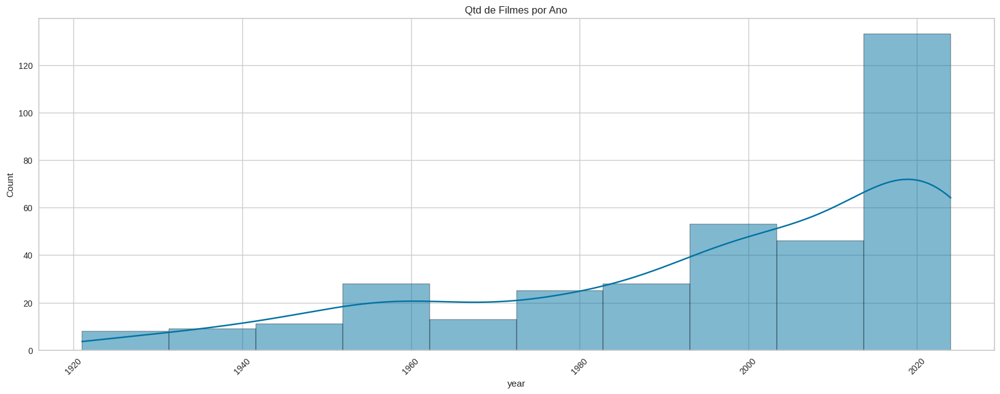

In [275]:
plt.figure(figsize = (20,7))
sns.histplot( df,
              x = 'year',
              kde = True).set_title('Qtd de Filmes por Ano')
plt.xticks(rotation=45)
plt.show()

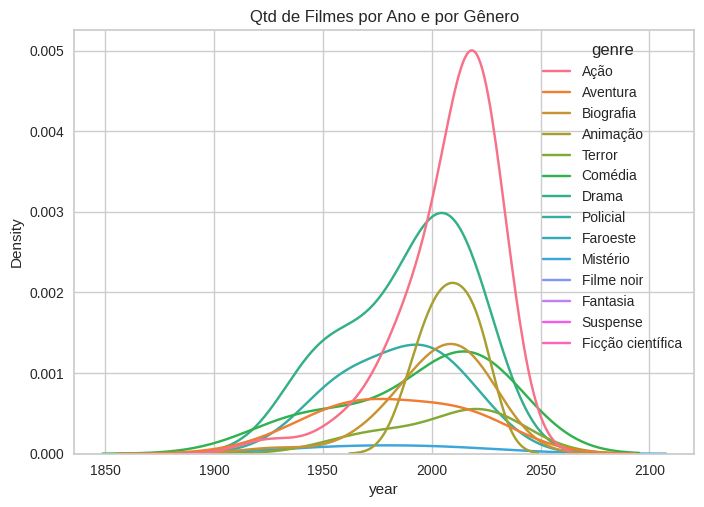

In [276]:
sns.kdeplot( df, x = 'year', hue = 'genre', bw_adjust = 1.5, warn_singular = False).set_title('Qtd de Filmes por Ano e por Gênero')
plt.show()

# Pré-processamento de texto

In [277]:
#convert sinopses to lowercase
df_processed = df.copy()
df_processed['sinopse'] = df_processed['sinopse'].str.lower()
df_processed['sinopse'].head()

0    jaime reyes, um adolescente de origem mexicana...
1    viver na terra da barbie é ser um ser perfeito...
2    a história do cientista americano j. robert op...
3    os irmãos tartaruga trabalham para conquistar ...
4    um cachorro abandonado se une a outros vira-la...
Name: sinopse, dtype: object

In [278]:
def qty_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

In [279]:
### Feature Engineering
df_processed['word_count'] = df_processed['sinopse'].apply(qty_words).astype('int64')
df_processed.head()

,title_pt,title_en,year,rating,genre,sinopse,word_count
0,Besouro Azul,1. Besouro Azul,2023,6.8,Ação,"jaime reyes, um adolescente de origem mexicana...",24
1,Barbie,2. Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29
2,Oppenheimer,3. Oppenheimer,2023,8.6,Biografia,a história do cientista americano j. robert op...,17
3,As Tartarugas Ninja: Caos Mutante,4. As Tartarugas Ninja: Caos Mutante,2023,7.5,Animação,os irmãos tartaruga trabalham para conquistar ...,19
4,Ruim Pra Cachorro,5. Ruim Pra Cachorro,2023,6.4,Animação,um cachorro abandonado se une a outros vira-la...,15


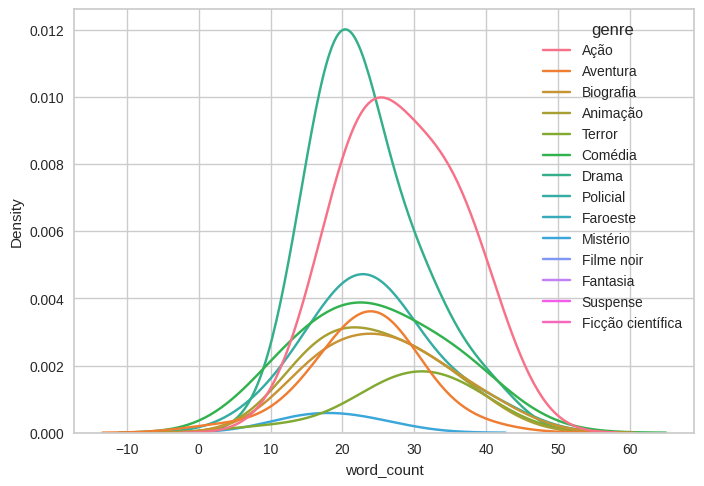

In [280]:
sns.kdeplot( df_processed, x = 'word_count', hue = 'genre', bw_adjust = 1.5, warn_singular = False)
plt.show()

## Nuvem de palavras

### Antes de remover as stopwords

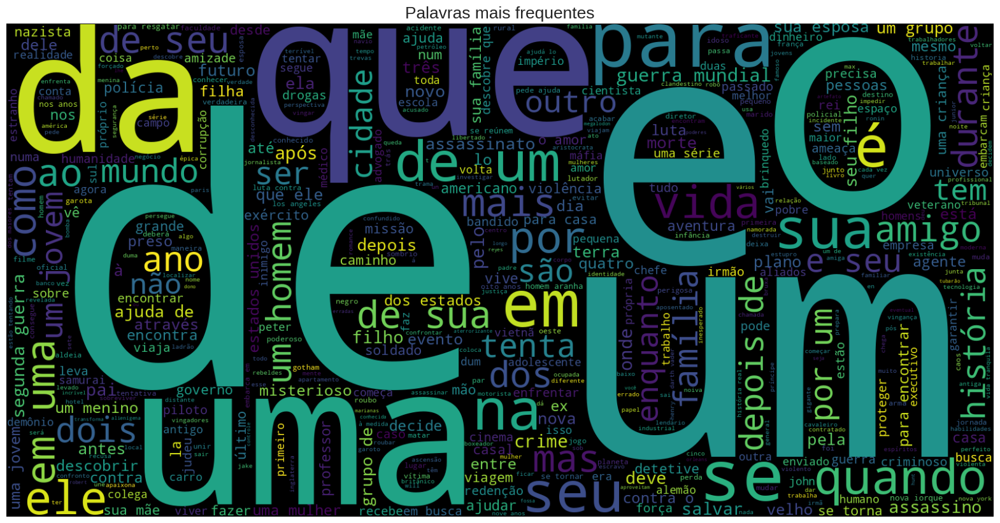

In [281]:
text = ' '.join([phrase for phrase in df_processed['sinopse']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes', fontsize = 19)
plt.show()

### Após remoção das stopwords

In [282]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('portuguese')
print(stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/henrico/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


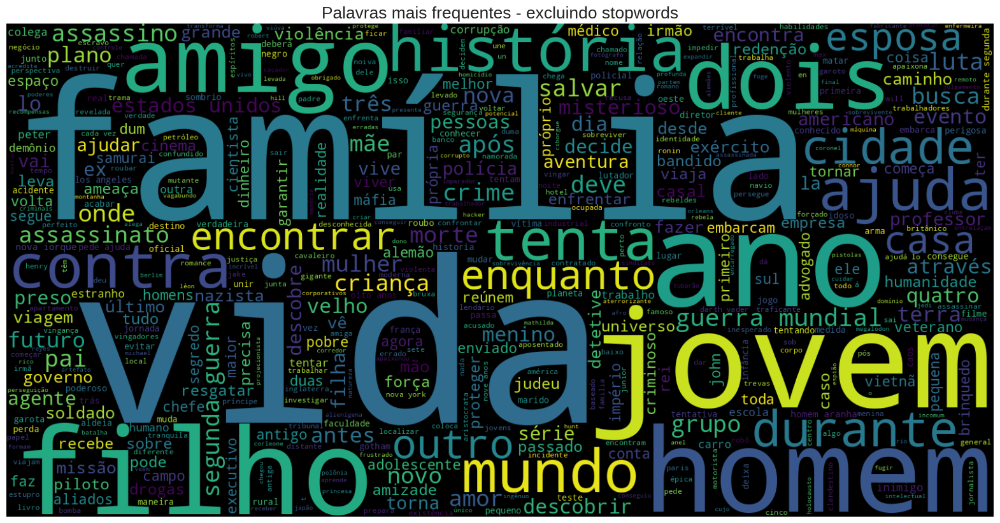

In [283]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
text = ' '.join([phrase for phrase in df_processed['sinopse_no_stopwords']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes - excluindo stopwords', fontsize = 19)
plt.show()

## Aplicando TF-IDF
Term Frequency-Inverse Document Frequency

O TF-IDF define a importância de um termo levando em consideração a importância desse termo em um único documento e dimensionando-o por sua importância em todos os documentos.

In [284]:
def limpar_texto(texto):
    stemmer = PorterStemmer()
    texto = normalize('NFKD', texto).encode('ASCII', 'ignore').decode('utf-8').lower()
    texto = texto.translate(str.maketrans('', '', string.punctuation))
    # palavras = texto.split()
    # stemmed_palavras = [stemmer.stem(palavra) for palavra in palavras]
    # texto_limpo = ' '.join(stemmed_palavras)
    # return texto_limpo
    return texto

In [285]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse_no_stopwords'].apply(limpar_texto)

In [286]:
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(df_processed['sinopse_no_stopwords'])

In [287]:
print(X.shape)
X.toarray()

(354, 148)


array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.74349712,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

# KMeans - Clusterização

## Escolhendo o numero de "k" clusters ideal

### Método Elbow

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



2 323.0772523888235
3 316.7280765475505


4 316.1779760536164
5 305.399605780628
6 305.54969761466305
7 301.9760336060589
8 298.5061035713416
9 292.73943071983194
10 291.3458064528984
11 286.45376202409926
12 281.97598350685126
13 280.3812647930395
14 277.9009588008593


Text(0, 0.5, 'WCSS')

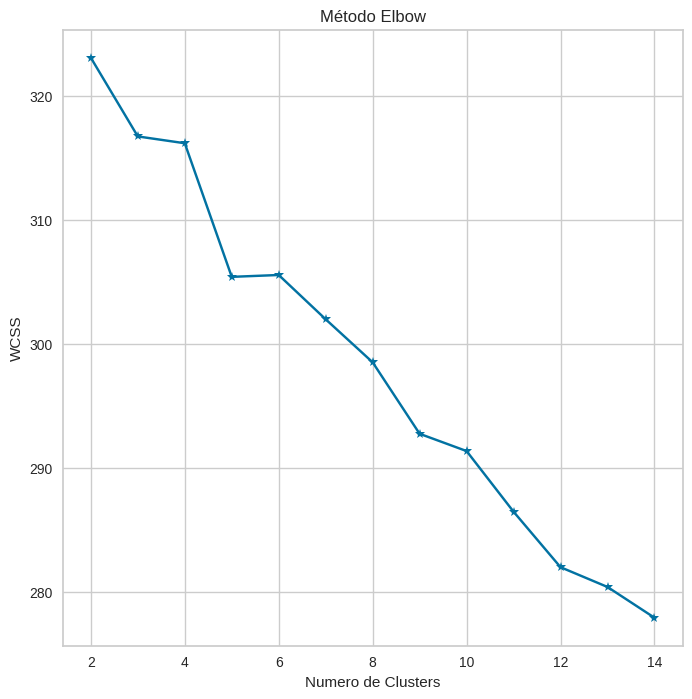

In [288]:
plt.figure(figsize = (8,8))

#plotando o grafico do método elbow
wcss = []

for i in range(2, df_processed.genre.nunique()+1):
  kmeans = KMeans(n_clusters = i, init = 'random')
  kmeans.fit(X)
  print(i, kmeans.inertia_)
  wcss.append(kmeans.inertia_)

plt.plot(range(2, df_processed.genre.nunique()+1), wcss, '*-')
plt.title('Método Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WCSS') #within cluster sum of square


### Método Silhouette

IndexError: index 5 is out of bounds for axis 0 with size 5

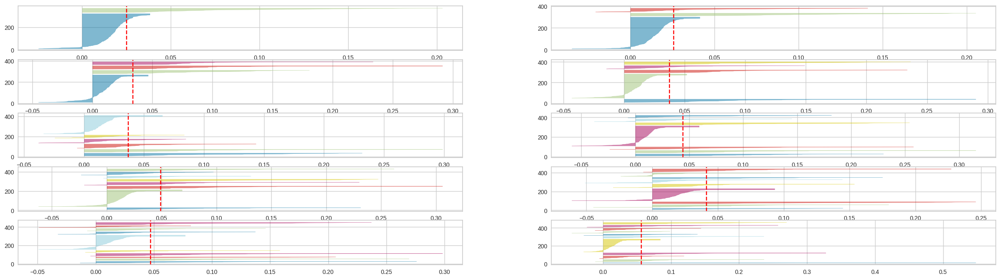

In [289]:
fig, ax = plt.subplots(5,2, figsize = (30,8))
for i in (range(2, df_processed.genre.nunique()+1)):
  #Creating KMeans instance for different number of clusters
  kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10, max_iter = 100, random_state = 42)
  q, mod = divmod(i,2)

  #Creating SilhouetteVisualizer instance with KMeans instance
  #Fit the visualizer

  visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick', ax = ax[q-1][mod])
  visualizer.fit(X)

In [ ]:
df_processed

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords
0,Um Sonho de Liberdade,1. Um Sonho de Liberdade,1994,9.3,Drama,dois homens presos se reúnem ao longo de vário...,21,dois homens presos reunem longo varios anos en...
1,O Poderoso Chefão,2. O Poderoso Chefão,1972,9.2,Policial,o patriarca idoso de uma dinastia do crime org...,20,patriarca idoso dinastia crime organizado tran...
2,Batman: O Cavaleiro das Trevas,3. Batman: O Cavaleiro das Trevas,2008,9.0,Ação,quando a ameaça conhecida como o coringa surge...,33,ameaca conhecida coringa surge passado causa e...
3,O Poderoso Chefão II,4. O Poderoso Chefão II,1974,9.0,Policial,"em 1950, michael corleone, agora à frente da f...",41,1950 michael corleone agora frente familia ten...
4,12 Homens e uma Sentença,5. 12 Homens e uma Sentença,1957,9.0,Policial,o julgamento de um assassinato em nova iorque ...,29,julgamento assassinato nova iorque frustrado u...
...,...,...,...,...,...,...,...,...
330,Duna: Parte Dois,Duna: Parte Dois,2024,NaN,Ação,um menino se torna o messias dos nômades em um...,21,menino torna messias nomades planeta deserto v...
331,O Rei Macaco,O Rei Macaco,2023,5.8,Animação,segue um macaco cheio de carisma e seu bastão ...,34,segue macaco cheio carisma bastao magico dois ...
332,Dunkirk,Dunkirk,2017,7.8,Ação,"soldados aliados da bélgica, do império britân...",25,soldados aliados belgica imperio britanico fra...
333,Guardiões da Galáxia,Guardiões da Galáxia,2014,8.0,Ação,um grupo de criminosos intergalácticos deve se...,20,grupo criminosos intergalacticos deve unir imp...


### Metodo Calinski e Davies

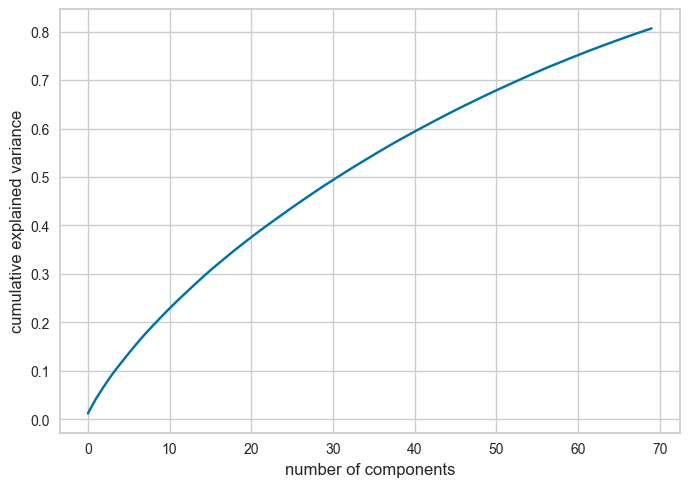

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=70)
X_reduced = svd.fit_transform(X)

plt.plot(np.cumsum(svd.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [290]:
from sklearn.cluster import KMeans
import os
from shutil import copyfile
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/clust

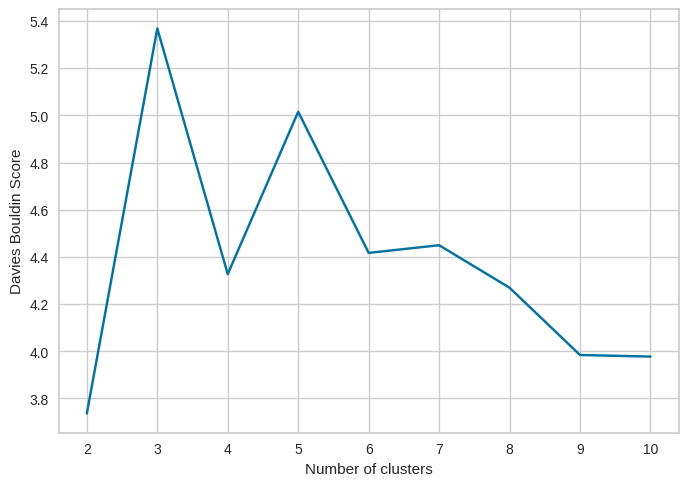

In [291]:
results = {}

for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=30)
    labels = kmeans.fit_predict(X.toarray())
    db_index = davies_bouldin_score(X.toarray(), labels)
    results.update({i: db_index})

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Davies Bouldin Score")
plt.show()

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/clust

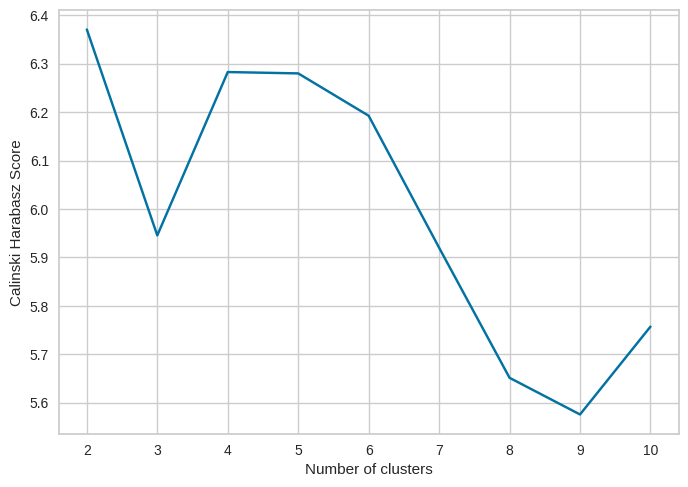

In [292]:
results = {}

for i in range(2,11):
    kmeans = KMeans(n_clusters=i, random_state=30)
    labels = kmeans.fit_predict(X.toarray())
    db_index = calinski_harabasz_score(X.toarray(), labels)
    results.update({i: db_index})

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Calinski Harabasz Score")
plt.show()

### Análise do número de clusters | k = 10
* Ao analisar os 4 metodos de calculos de cluster, foi decidido que com um numero de 10 clusters, pois com o calculo de calinski resultou em 9 e 10 clusters mais proximos do eixo x. E por conta da quantidade de amostras que temos.

# Comparativo entre os 10 clusters

In [293]:
# initialize kmeans with 10 centroids
kmeans = KMeans(n_clusters = 10, random_state=42)
# fit the model
kmeans = kmeans.fit(X)
#predicting the clusters and store cluster labels in a variable
labels = kmeans.predict(X)
#getting the cluster centers
c = kmeans.cluster_centers_

df_processed['cluster'] = labels
df_processed.head()

/home/henrico/Github/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
0,Besouro Azul,1. Besouro Azul,2023,6.8,Ação,"jaime reyes, um adolescente de origem mexicana...",24,jaime reyes adolescente origem mexicana encont...,5
1,Barbie,2. Barbie,2023,7.4,Aventura,viver na terra da barbie é ser um ser perfeito...,29,viver terra barbie perfeito lugar perfeito men...,8
2,Oppenheimer,3. Oppenheimer,2023,8.6,Biografia,a história do cientista americano j. robert op...,17,historia cientista americano j robert oppenhei...,5
3,As Tartarugas Ninja: Caos Mutante,4. As Tartarugas Ninja: Caos Mutante,2023,7.5,Animação,os irmãos tartaruga trabalham para conquistar ...,19,irmaos tartaruga trabalham conquistar amor cid...,5
4,Ruim Pra Cachorro,5. Ruim Pra Cachorro,2023,6.4,Animação,um cachorro abandonado se une a outros vira-la...,15,cachorro abandonado une outros viralatas vinga...,5


## Filmes por cluster

In [294]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

## % de Gêneros por Cluster

/home/henrico/Github/venv/lib/python3.10/site-packages/seaborn/categorical.py:3201: UserWarning:

Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.

/home/henrico/Github/venv/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



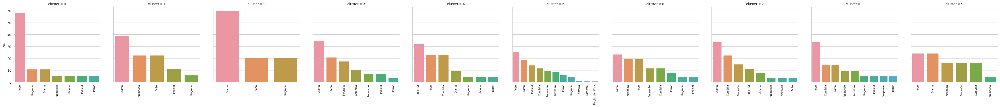

In [295]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

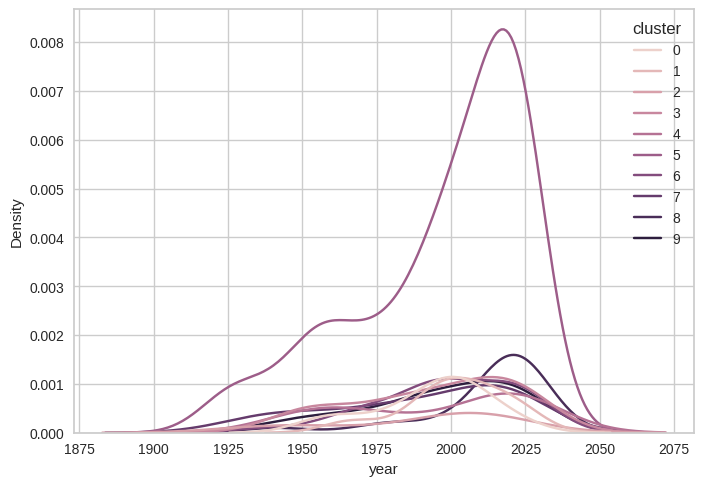

In [296]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [297]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,0,1,2,3,4,5,6,7,8,9
0,Animação,5.263158,22.222222,0.0,6.896552,0.000000,9.554140,11.538462,3.703704,9.523810,4.0
1,Aventura,0.000000,0.000000,0.0,0.000000,0.000000,8.280255,19.230769,3.703704,9.523810,16.0
2,Ação,57.894737,22.222222,20.0,20.689655,22.727273,25.477707,19.230769,3.703704,33.333333,24.0
3,Biografia,10.526316,5.555556,20.0,17.241379,4.545455,4.458599,3.846154,14.814815,4.761905,16.0
4,Comédia,0.000000,0.000000,0.0,10.344828,22.727273,11.464968,11.538462,22.222222,14.285714,16.0
5,Drama,10.526316,38.888889,60.0,34.482759,9.090909,18.471338,23.076923,33.333333,14.285714,24.0
6,Fantasia,0.000000,0.000000,0.0,0.000000,0.000000,0.636943,0.000000,0.000000,0.000000,0.0
7,Faroeste,0.000000,0.000000,0.0,0.000000,0.000000,0.636943,0.000000,0.000000,0.000000,0.0
8,Ficção científica,0.000000,0.000000,0.0,0.000000,0.000000,0.636943,0.000000,0.000000,0.000000,0.0
9,Mistério,5.263158,0.000000,0.0,0.000000,4.545455,0.000000,0.000000,7.407407,0.000000,0.0


In [298]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,0,5.263158
1,Aventura,0,0.000000
2,Ação,0,57.894737
3,Biografia,0,10.526316
4,Comédia,0,0.000000


In [299]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

# Nuvem de Palavras por Cluster

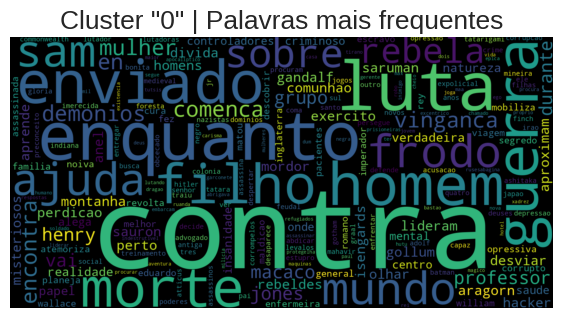

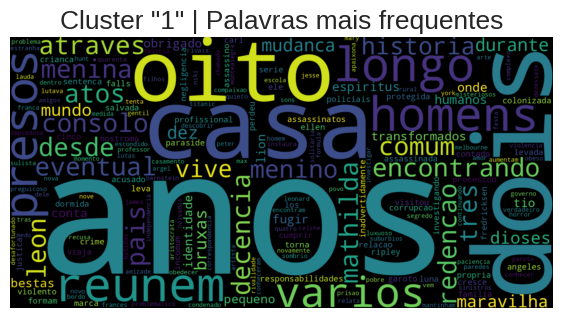

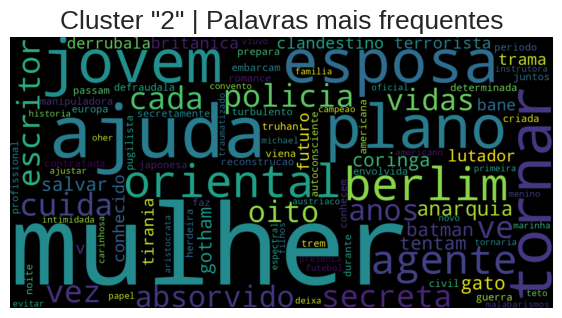

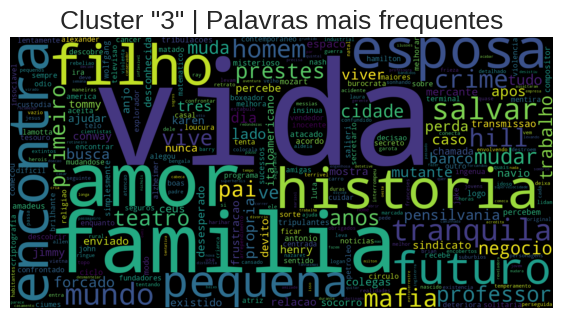

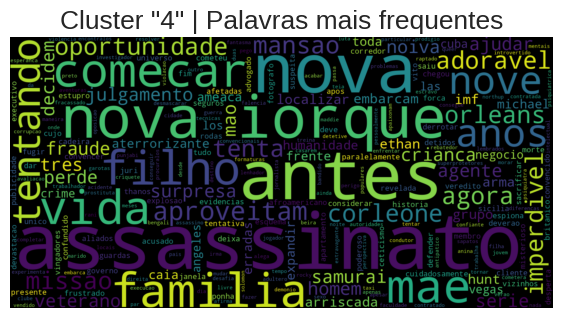

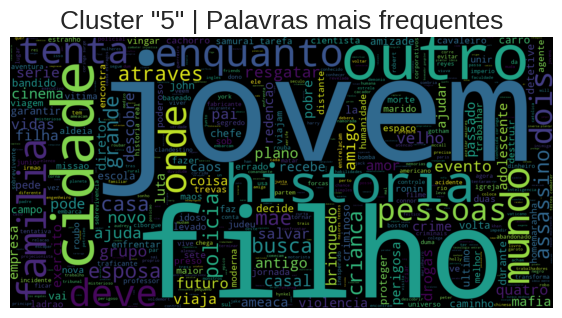

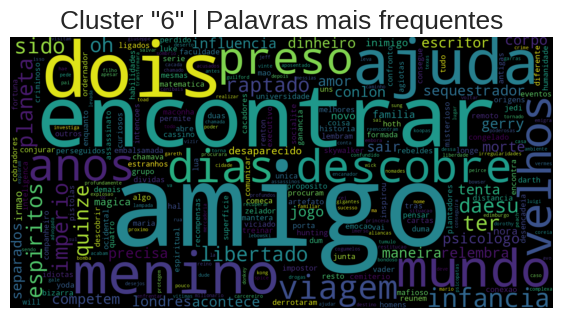

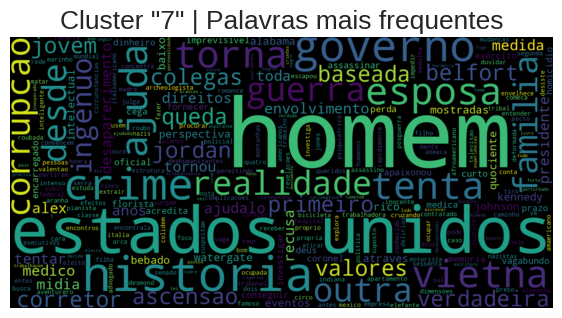

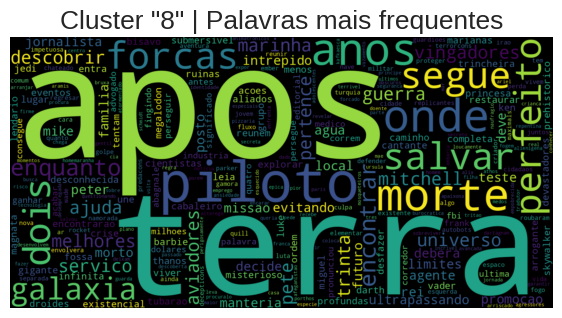

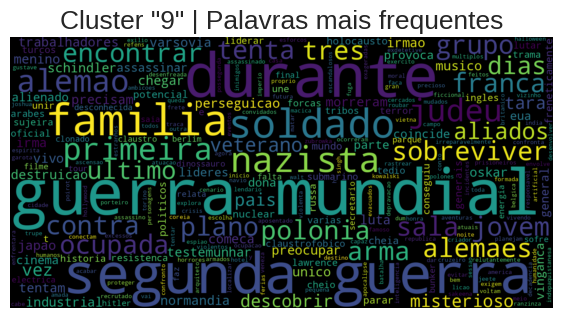

In [300]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

for c in range(10):
  word_cloud_cluster(c)

# Considerações Finais
* **Exercício: Reescrever as análises / conclusões devido a atualização da base**

** Na seção "Comparativo entre os 10 clusters" foram apresentadas diferentes formas de caracterizar cada cluster.**

1. Primeiro foi demonstrado que o cluster #2 foi o que apresentou o maior número de amostras (filmes). _(Idealmente os cluster devem conter quantidades balanceadas, porém neste projeto, por ter um dataset com baixo número de amostras (250), não foi possível atender esta premissa)_.

2. Depois foi analisado o % de cada gênero por cluster, sendo os dois gêneros mais representativos do:

  2.1 Cluster 0: Ação, Biografia, Drama, Animação, Mistério, Policial, Terror. Com a maior parte em Ação.

  2.2 Cluster 1: Drama, Animação, Ação, Policial, Biografia. Maior fatia em Drama.  

  2.3 Cluster 2: Drama, Ação, Biografia. Enfase em Drama para este cluster.

  2.4 Cluster 3: Drama, Ação, Biografia, Comédia, Animação, Policial, Terror. Drama prevaleceu.

  2.5 Cluster 4: Policial, Ação, Comédia, Drama, Biografia, Misterio, Terror. Para os tres primeiros um quase empate, assim como os 3 ultimos. 

  2.6 Cluster 5: Ação, Drama, Policial, Comedia, Animacao, Aventura, Terror, Biografia, Fantasia, Faroeste, Ficcao Cientifica. Neste cluster, apesar da variedade de generos, Acao pode ter uma melhor relevancia.

  2.7 Cluster 6: Drama, Aventura, Ação, Animacao, Comédia, Terror, Biografia, Policial. Drama novamente com a maior parte!

  2.8 Cluster 7: Drama, Comedia, Biografia, Policial, Misterio, Animacao, Aventura, Acao. Drama com a maior parte, porem houve uma linearidade entre os demais.

  2.9 Cluster 8: Acao, Comedia, Drama, Animacao, Aventura, Biografia, Policial, Suspense, Terror. Acao com a maior parte, porem houve uma linearidade entre os demais.

  2.9.1 Cluster 9: Quase empate entre os generos Acao, Drama, Aventura, Biografia, Comedia, Animacao.


3. Na sequência foi avaliado a distribuição dos anos de lançamento dos filmes por cluster, sem diferença siginificativa entre eles, com maior concentração ao redor do ano 2000. Apesar de apresentar uma densidade exacerbada para o cluster 6. É possivel que o resultado enorme obtido seja por conta da base de dados desbalanceada, e ou por poucas amostras. 

4. O grafico de radar apresentado, pode ser analisado com os seguintes pontos:

  4.1 Mistério, Suspense, Faroeste, Ficcao Cientifica, e Fantasia quase nao tiveram relevancia para os clusters.
  
  4.2 Terror e Comédia apesar de estarem entre os maiores relevantes, nao apresentaram relevancia na separaçao dos clusters.

  4.3 Os clusters 0 e 2 apresentam muita relevancia para os generos de Drama e Ação, respectivamente.


5. E finalmente, foram apresentadas as nuvens de palavras por cluster, onde em linhas gerais destacam-se:

  5.1 o Cluster 0 -> Senhor dos Aneis (É possivel identificar que o cluster 0 obteve uma alta taxa de acerto para o genero que mais aparece neste cluster: Açao)

  5.2 o Cluster 1 -> Casa, Anos, Presos. (Acertos para com seu genero principal: Drama)

  5.3 o Cluster 2 -> Esposa, Mulher, Escritor, Berlim. (Acertos para com seu genero principal: Drama)

  5.4 o Cluster 3 -> Filho, Vida, Amor, Encontro. (Acertos para com seu genero principal: Drama)

  5.5 o Cluster 4 -> Filho, Assassinato, Familia, Mae (Este Cluster teve uma alta taxa de acerto para com seu genero, Policial)

  5.6 o Cluster 5 -> Jovem, Cidade, Familia, Historia, Restagar. (Acertos para com seu genero principal: Ação)

  5.7 o Cluster 6 -> Amigo, Menino, Viagem. (Acertos para com seu genero principal: Drama)

  5.8 o Cluster 7 -> Homem, Crime, Estados Unidos, Corrupcao. (Embora este Cluster apresentou poucos acertos para com seu genero: Drama, é possivel que com uma nova leva de dados, possa melhorar)

  5.9 o Cluster 8 -> Piloto, Terra, Morte, Galaxia, Mitchell (Acertos para com seu genero principal: Ação)

  5.9.1 o Cluster 9 -> Guerra mundial, Segunda guerra, Polonia, Nazismo, Sobreviver, Alemaes (Acertos para com seu genero principal: Ação)



** Em resumo neste projeto foram aplicados conceitos de:

1. Webscraping / Crawler para coleta de dados do site IMDb
2. Pré-processamento de texto com utilização de técnicas de NLP, limpeza do texto, lemmatização, remoção de stopwords, remoção de pontuação, remoção de acentuação.
3. Tecnicas e abordagens diferentes para definir o numero adequado de clusters, que, a partir desses resultados, foi denifido que o numero de clusters mais adequado é o de 10 clusters, e conforme acima, foi possivel obter bons resultados, metodos:
  3.1 Metodo Elbow
  3.2 Metodo Silhouette
  3.3 Metodo Davies Bouldin Score
  3.4 Metodo Calinski Harabasz Score
4. Clusterização


Desta forma consideramos que o objetivo inicial foi atingido sendo possível a clusterização dos filmes baseado na sinopse / descrição de cada um, gerando desta forma a possibilidade de recomendar filmes aos usuários não apenas pela classificação tradicional por gêneros, mas também pelos clusters identificados neste projeto.

Os posters dos filmes foram extraidos do site tambem, para que assim, futuramente possamos realizar uma melhor analise com base nas imagens, e tambem, dar um melhor retorno ao solicitante, ao recomendar um filme!
A extraçao dessas imagens de posters foi feita atravez de webscrapping e arrays numpy, onde baixamos a imagem em ioBytes e a convertemos em escala de cinza, posteriormente em array numpy.

**Em termos práticos, se um usuário avalia positivamente um filme, os filmes pertecentes ao mesmo cluster podem ser recomendados a ele.**
